# Τεχνικές Εξόρυξης Δεδομένων

## Ομάδα:
## Αλέξιος Σπηλιωτόπουλος,    1115201700147
## Κωνσταντίνος Λεονταρίδης, 1115201700071

# Μέρος 1ο: Data exploration

### Σημείωση: για να ανοίξουμε το αρχείο train.csv, πρέπει πρώτα να τρέξουμε το 'generate_train.ipynb', το οποίο το δημιουργεί και αναλαμβάνει τον καθαρισμό των δεδομένων.

In [59]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
# import nltk
from wordcloud import WordCloud, STOPWORDS
import folium
from folium import plugins


train_df = pd.read_csv("train.csv")
train_df.head()

,id,name,description,transit,host_since,host_response_rate,host_has_profile_pic,host_identity_verified,neighbourhood,city,...,price,minimum_nights,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,instant_bookable,cancellation_policy,month
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",Athens Furnished Apartment No6 is 3-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,73.0,1,222,19,2011-05-20,2019-04-08,97.0,t,strict_14_with_grace_period,april
1,10988,"75m2, 2-br, metro, wi-fi, cable TV",Athens Furnished Apartment No4 is 2-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,82.0,1,0,31,2012-10-21,2017-11-23,92.0,t,strict_14_with_grace_period,april
2,10990,"50m2, Metro, WI-FI, cableTV, more",Athens Furnished Apartment No3 is 1-bedroom ap...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,49.0,1,234,29,2012-09-06,2019-03-03,97.0,t,strict_14_with_grace_period,april
3,10993,"Studio, metro, cable tv, wi-fi, etc",The Studio is an -excellent located -close t...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,38.0,1,226,45,2012-09-24,2019-04-04,96.0,t,strict_14_with_grace_period,april
4,10995,"47m2, close to metro,cable TV,wi-fi",AQA No2 is 1-bedroom apartment (47m2) -excell...,Note: 5-day ticket for all the public transpor...,2009-09-08,100%,t,t,Ambelokipi,Athens,...,49.0,2,249,17,2010-07-08,2019-04-04,95.0,t,strict_14_with_grace_period,april


## Ερώτημα 1.1: Συχνότερος τύπος δωματίου(room_type)

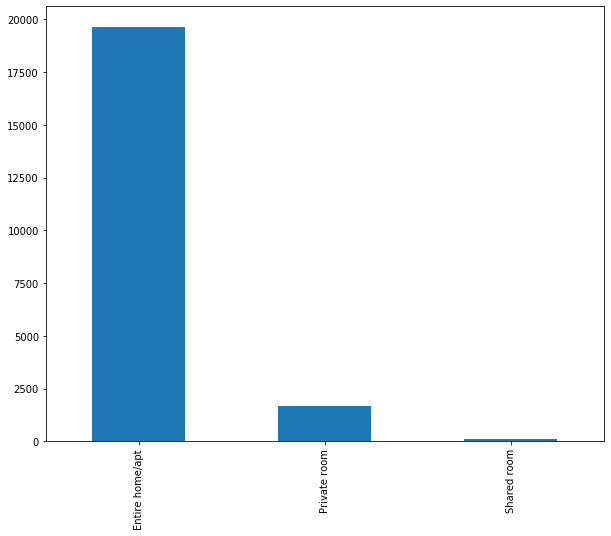

In [2]:
train_df['room_type'].value_counts().plot.bar(figsize=(10,8))

## Ερώτημα 1.2: πορεία τιμών για το διάστημα των μηνών Φεβρουαρίου, Μαρτίου, Απριλίου

Διαβάζουμε το αρχείο calendar.csv από τον μήνα Φεβρουάριο.

In [60]:
feb_cal = pd.read_csv(os.getcwd()+'/data/february/calendar.csv', usecols=['listing_id','date','price'])
feb_cal = feb_cal.dropna()

Φτιάχνουμε την μορφή της στήλης 'prices'.

In [4]:
""" Replace dolar sign on prices and convert them to float type. """
feb_cal['price'] = [x.replace('$', '') for x in feb_cal['price']]
feb_cal.price = [x.replace(',', '') for x in feb_cal.price]
feb_cal['price'] = pd.to_numeric(feb_cal['price'])
feb_cal.head()

,listing_id,date,price
0,571492,2019-02-08,264.0
1,571492,2019-02-09,264.0
2,571492,2019-02-10,264.0
3,571492,2019-02-11,264.0
4,571492,2019-02-12,264.0


Αλλάζουμε τη μορφή των ημερομηνιών.

In [5]:
feb_cal['date']= pd.to_datetime(feb_cal['date'])

Κάνουμε filtering στις ημερομηνίες, για να πάρουμε το διάστημα από αρχές Φεβρουαρίου μέχρι το τέλος του Απρίλη.

In [6]:
start_date = pd.to_datetime('2019-2-8')
end_date = pd.to_datetime('2019-4-30')

filtered = feb_cal[(feb_cal['date'] >= start_date) & (feb_cal['date'] <= end_date)]

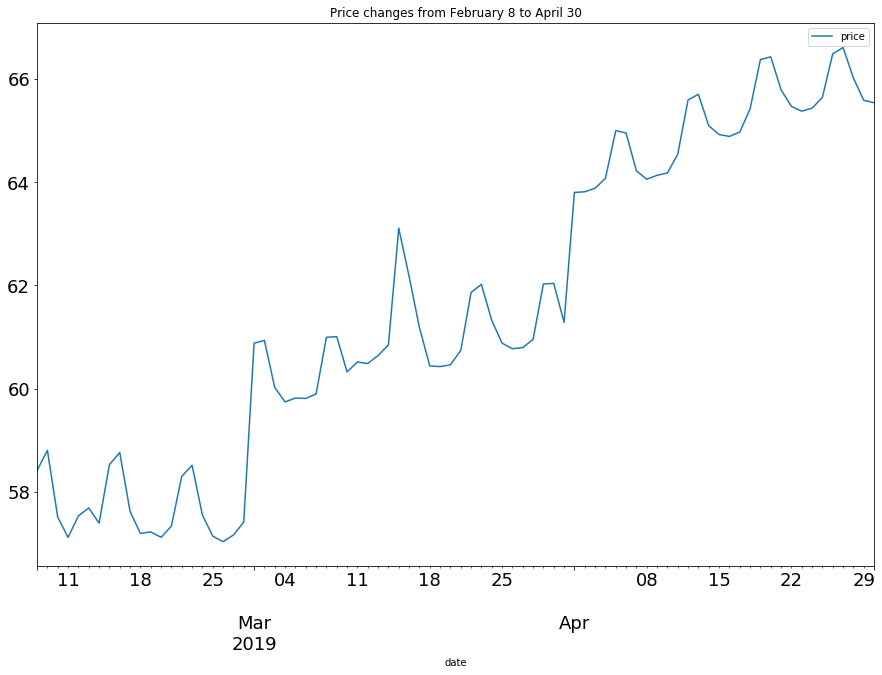

In [7]:
price_course = filtered.groupby("date").agg({"price" : np.mean})
price_course.plot(title = 'Price changes from February 8 to April 30',
                  figsize=(15,10),
                  fontsize=18)

## Ερώτημα 1.3: 5 πρώτες γειτονιές με τις περισσότερες κριτικές


The five most reviewed neighbourhoods are:


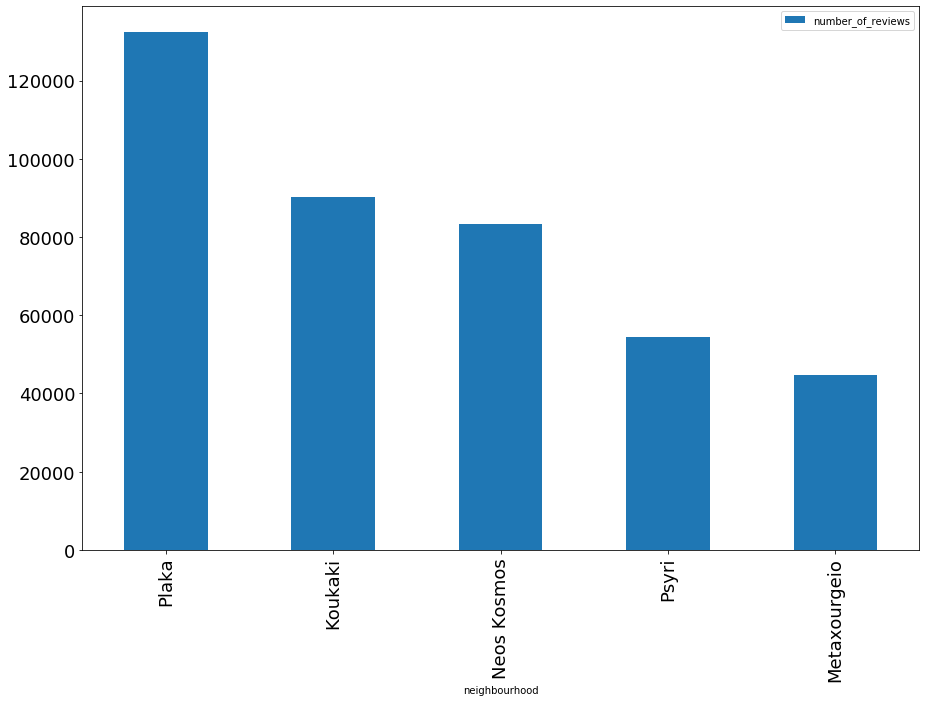

In [8]:
print("The five most reviewed neighbourhoods are:")
df = train_df.groupby("neighbourhood").agg({"number_of_reviews" : sum}).sort_values(by = "number_of_reviews", ascending = False)
df.head(5).plot.bar(figsize=(15,10),
                  fontsize=18)

## Ερώτημα 1.4: Γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων

In [9]:
print("The neighbourhood with the most estate logs is",train_df['neighbourhood'].value_counts().idxmax())

The neighbourhood with the most estate logs is Plaka


## Ερώτημα 1.5: Αριθμός καταχωρήσεων ανά γειτονιά και ανά μήνα

Παρατηρούμε από το heatmap ότι η περιοχή με τα περισσότερα ενοικιαζόμενα είναι η Πλάκα.


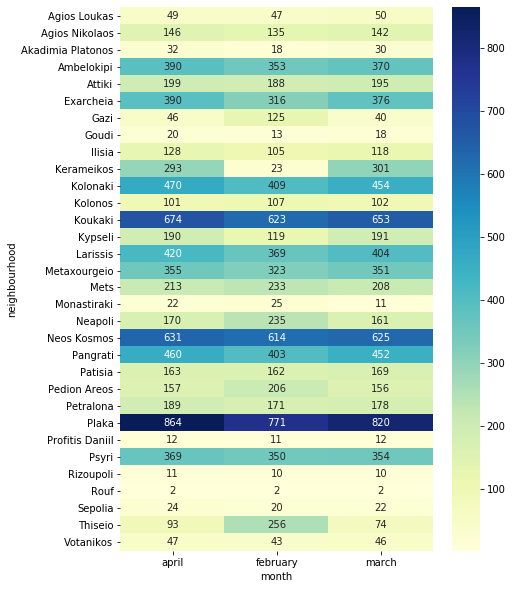

In [10]:
dataset = train_df.groupby(["neighbourhood","month"]).size().to_frame(name='count').reset_index()
dataset = dataset.pivot(index='neighbourhood', columns='month', values='count')
plt.subplots(figsize=(7,10))
hmap = sns.heatmap(dataset, annot=True, fmt="g", cmap='YlGnBu')
print("Παρατηρούμε από το heatmap ότι η περιοχή με τα περισσότερα ενοικιαζόμενα είναι η Πλάκα.")

## Ερώτημα 1.6: Ιστόγραμμα της στήλης "neighbourhood"

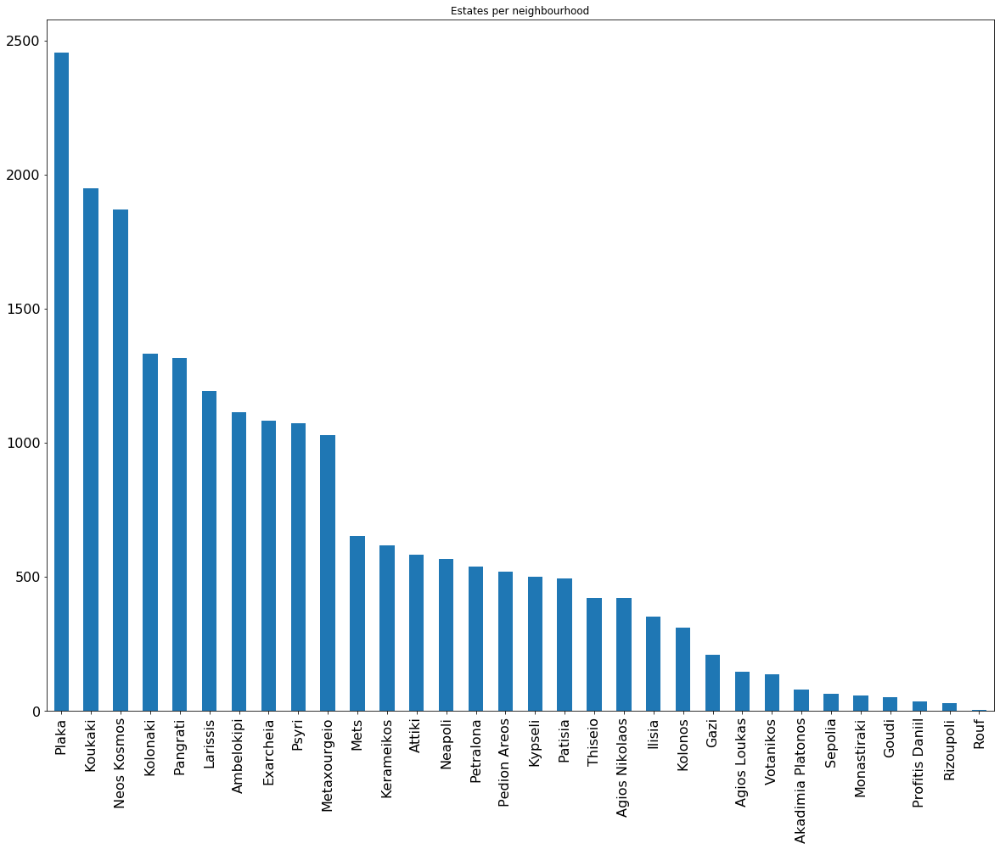

In [11]:
neigh_hgram = train_df.neighbourhood.value_counts()
neigh_hgram.plot.bar(title = 'Estates per neighbourhood',
                  figsize=(20,15),
                  fontsize=16)

## Ερώτημα 1.7: Συχνότερος τύπος δωματίου(room_type) ανά γειτονιά(neighbourhood)

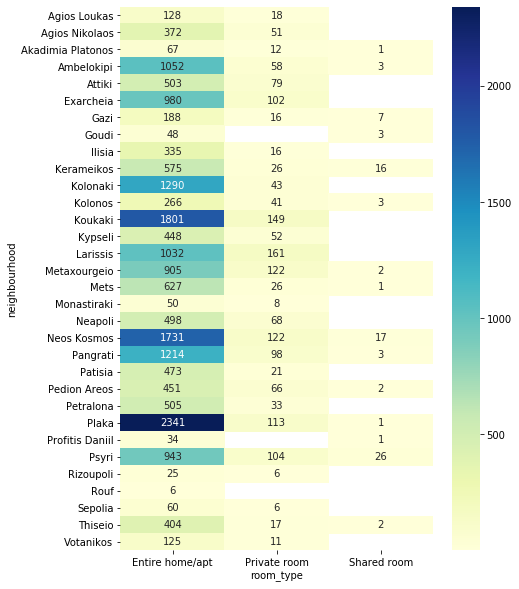

In [12]:
# print("Most common room type for every neighbourhood is:")
# train_df.groupby("neighbourhood")['room_type'].agg(lambda x:x.value_counts().index[0])
dataset = train_df.groupby(["neighbourhood","room_type"]).size().to_frame(name='count').reset_index()
dataset = dataset.pivot(index='neighbourhood', columns='room_type', values='count')
plt.subplots(figsize=(7,10))
hmap = sns.heatmap(dataset, annot=True, fmt="g", cmap='YlGnBu')

## Ερώτημα 1.8: Ακριβότερος τύπος δωματίου(room_type)


In [13]:
print("Most expensive room type is:")
train_df[train_df['price'] == train_df['price'].max()].room_type.head(1)

Most expensive room type is:


13311    Entire home/apt
Name: room_type, dtype: object

## Ερώτημα 1.9: Χάρτης ακινήτων τύπου cluster για το μήνα Απρίλιο

In [14]:
athens_in_april = folium.Map(location=[37.984338, 23.727009], zoom_start=13)

mac = plugins.MarkerCluster().add_to(athens_in_april)

april_df = train_df[train_df['month'] == 'april']

for i, v in april_df.iterrows():
    popup = """
                Location id: <b>%s</b><br>
                Room type: <b>%s</b><br>
                Bed_type: <b>%s</b><br>
                Neighbourhood: <b>%s</b><br>
                Price: <b>%s</b><br>
    """% (v["id"],v["room_type"],v["bed_type"],v["neighbourhood"],v["price"])
    
    if v['room_type'] == 'Entire home/apt':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=5,
                            tooltip=popup,
                            color='#FFBA00',
                            fill_color='#FFBA00',
                            fill=True).add_to(mac)
    elif v['room_type'] == 'Private room':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=5,
                            tooltip=popup,
                            color='#087FBF',
                            fill_color='#087FBF',
                            fill=True).add_to(mac)
    elif v['room_type'] == 'Shared room':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=5,
                            tooltip=popup,
                            color='#FF0700',
                            fill_color='#FF0700',
                            fill=True).add_to(mac)
athens_in_april

## Ερώτημα 1.10: Δημιουργία word cloud από τις στήλες neighbourhood, transit, description και last_review

### Neighbourhood word cloud

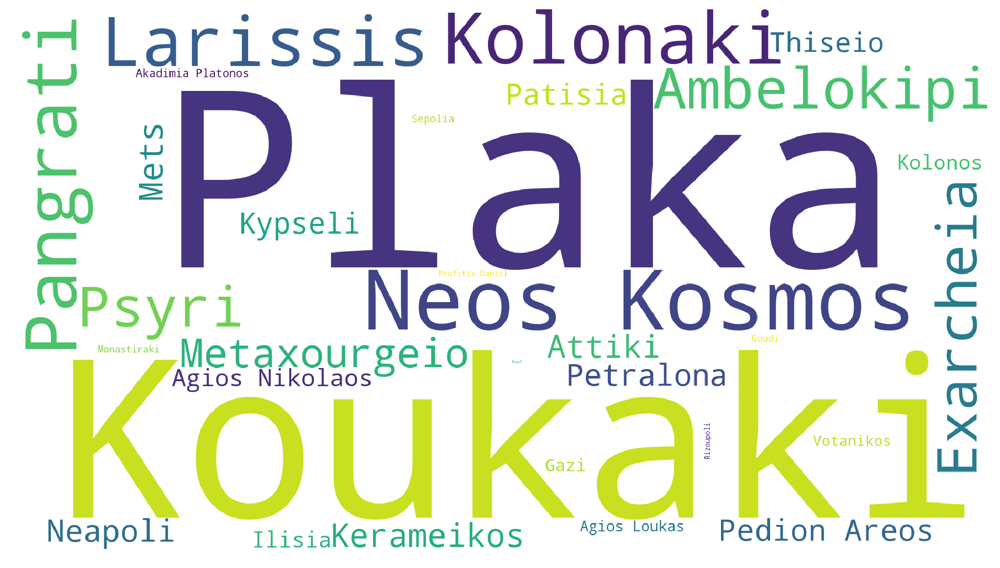

In [15]:
neighbourhood_df = train_df[train_df['neighbourhood'].notna()]['neighbourhood']
neigh_freq = tuple([tuple(x) for x in neighbourhood_df.value_counts().reset_index().values])

wordcloud = WordCloud(width=1920, height=1080, background_color='white').generate_from_frequencies(dict(neigh_freq))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### Transit word cloud

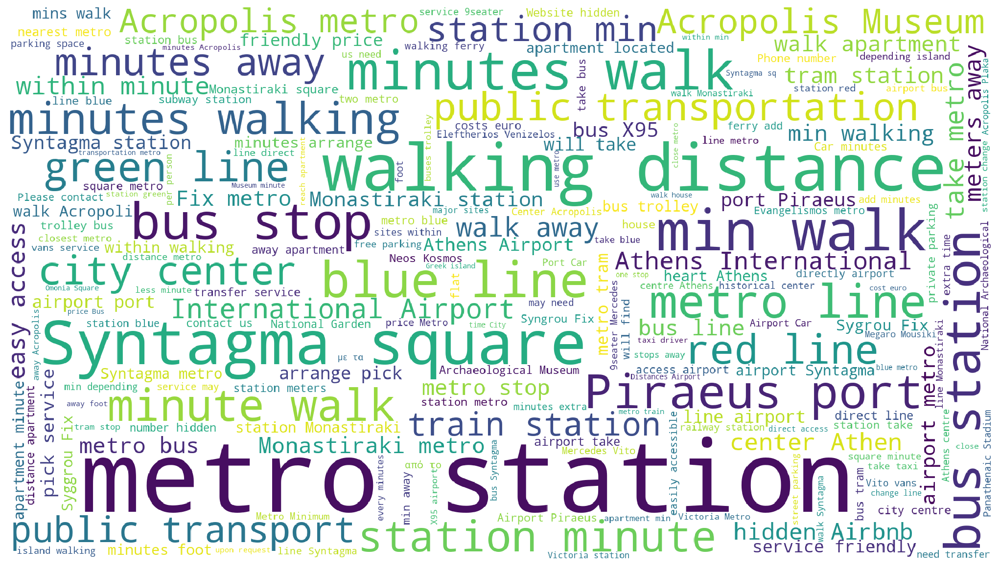

In [16]:
neighbourhood_df = train_df[train_df['transit'].notna()]['transit']
neigh_freq = tuple([tuple(x) for x in neighbourhood_df.value_counts().reset_index().values])

wordcloud2 = WordCloud(width=1920, height=1080, background_color='white').generate(' '.join(neighbourhood_df))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud2)
plt.axis("off")
plt.show()

### Description word cloud

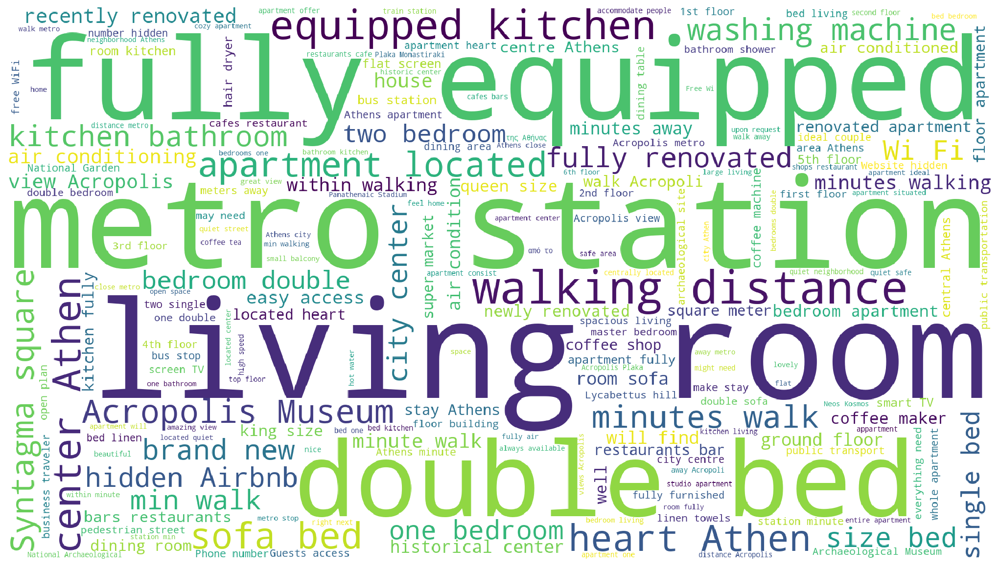

In [17]:
description_df = train_df[train_df['description'].notna()]['description']

wordcloud3 = WordCloud(width=1920, height=1080, background_color='white').generate(' '.join(description_df))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud3)
plt.axis("off")
plt.show()

### Last_reviews word cloud

In [18]:
df = train_df[train_df['month']=='february']
df = df[['id','last_review']]

reviews_df = pd.read_csv(os.getcwd()+"/data/february/reviews.csv")
reviews_df = reviews_df[reviews_df['comments'].notnull()]
reviews_df = reviews_df[['listing_id','date','comments']]

In [19]:
df = df.merge(reviews_df,left_on=['id','last_review'],right_on=['listing_id','date'])

In [20]:
reviews = df['comments']

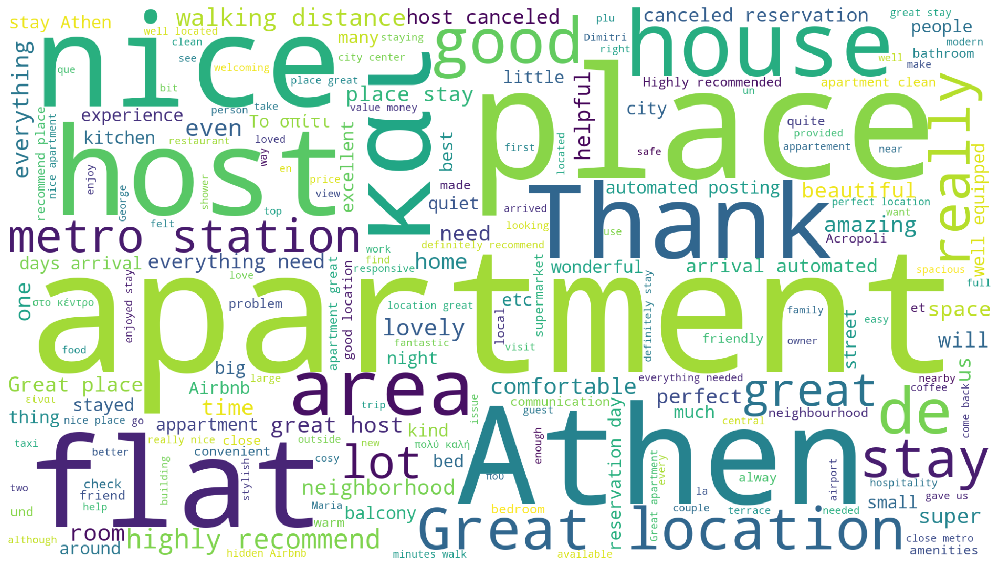

In [21]:
wordcloud4 = WordCloud(width=1920, height=1080, background_color='white').generate(' '.join(reviews))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud4)
plt.axis("off")
plt.show()

## Ερώτημα 1.11: Το συνολικό πλήθος ακινήτων με την ύψιστη κριτική,    με τιμή ανάμεσα σε 30-50 Ευρώ

In [22]:
price_filtered_df = train_df.loc[(train_df['price'] >= 30) &
                                 (train_df['price'] <= 50) &
                                 (train_df['review_scores_rating'] == 100)]
print("Total estates with perfect rating:",price_filtered_df.price.count())

Total estates with perfect rating: 2636


## Ερώτημα 1.12: Το πιο ακριβό ακίνητο στη γειτονιά με το μικρότερο πλήθος ακινήτων.

In [23]:
min = train_df['neighbourhood'].value_counts().idxmin()
df = train_df[['neighbourhood','price']]
df.loc[(df.neighbourhood == min)].sort_values(by = 'price', ascending = False).head(1)

,neighbourhood,price
13310,Rouf,55.0


# Μέρος 2ο: Recommendation System

In [24]:
rec_df = train_df[['id','name','description']]
rec_df = rec_df.where(pd.notnull(rec_df), "")
rec_df = rec_df.drop_duplicates("id").reset_index(drop=True)

Μετατρέπουμε το κείμενο του description σε lower case.

In [25]:
rec_df['description'] = rec_df['description'].str.lower()

## Description wordcloud χωρίς τα stopwords.

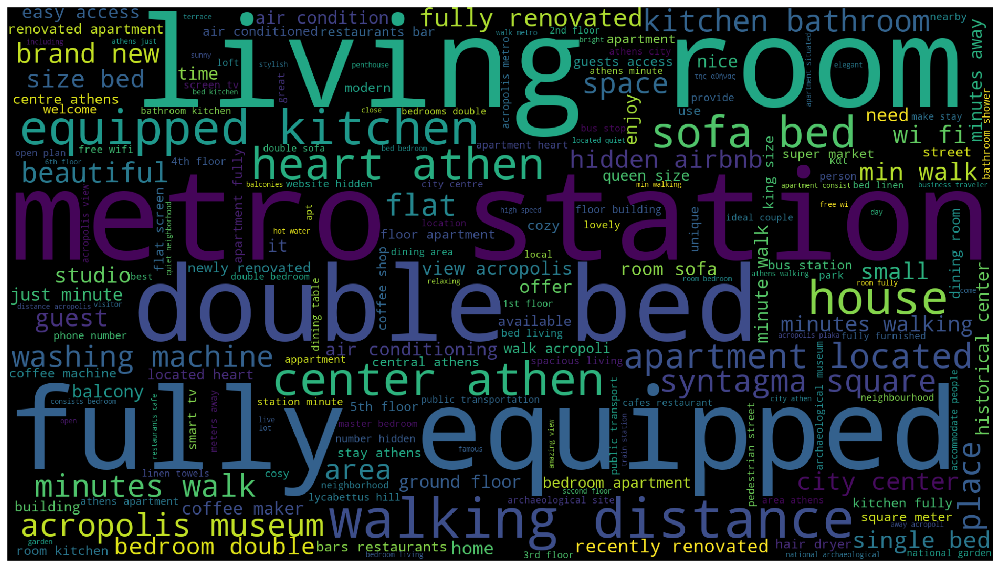

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS as stops

description = rec_df['description']
wordcloud3 = WordCloud(width=1920, height=1080, background_color='black',stopwords=stops).generate(' '.join(description))
plt.figure(figsize=(20,10), dpi=150)
plt.imshow(wordcloud3)
plt.axis("off")
plt.show()

Μετατρέπουμε τη στήλη name σε lower case και κάνουμε συνένωση των στηλών 'name' και 'description', αντικαθιστώντας τις NaN τιμές με τη κενή συμβολοσειρά.

In [27]:
rec_df['name'] = rec_df['name'].str.lower()

rec_df['summary'] = rec_df['name']+rec_df['description']

## Ερώτημα 3.1

Αρχικά κατασκευάζουμε τον πίνακα TF-IDF για τη νέα στήλη.

In [28]:
from sklearn.metrics.pairwise import cosine_similarity

summary = rec_df['summary']
vectorizer = TfidfVectorizer(ngram_range=(1,2), stop_words=stops)

X = vectorizer.fit_transform(summary)

## Ερώτημα 3.2

Υπολογίζουμε την cosine similarity που προκύπτει από τον πίνακα Χ.

In [29]:
cos_sim = cosine_similarity(X)

Παίρνουμε τον άνω τριγωνικό πίνακα, διότι θέλουμε μόνο μια φορά τα ζευγάρια(εάν παίρναμε ολόκληρο θα τα επέστρεφε δύο φορές στο τέλος με αντίθετη σειρά.

In [30]:
cos_sim1 = np.triu(cos_sim,k=1)

Στη συνέχεια παίρνουμε τις 100 μεγαλύτερες τιμές της cosine similarity, δηλαδή τα πιο όμοια ακίνητα.

In [31]:
idx = np.argsort(cos_sim1.ravel())[-100:][::-1]
similar = np.c_[np.unravel_index(idx, cos_sim1.shape)]

Tέλος, κατασκευάζουμε ένα λεξικό με κλειδιά τα IDs των σπιτιών, και τιμές τα IDs των σπιτιών που είναι πιο όμοια.

In [32]:
similar_estates = {}
for i,j in similar:
    id1 = rec_df.loc[[i]].id.values[0]
    id2 = rec_df.loc[[j]].id.values[0]
    similar_estates[id1] = id2

In [33]:
print("ID1:       ID2")
similar_estates

ID1:       ID2


{25207595: 25207888,
 25711811: 30723595,
 10603975: 27162716,
 14865006: 24171480,
 26497308: 30424563,
 31560654: 31561260,
 31558982: 31561260,
 32649434: 32650553,
 32650034: 32650553,
 27254673: 30009754,
 30314684: 30314687,
 18624578: 29174806,
 30314683: 30314687,
 29945264: 30373912,
 30341020: 30980510,
 30089884: 30760835,
 30363015: 30906405,
 30362269: 30363015,
 25941499: 26092250,
 30906405: 30980510,
 30760835: 30980510,
 30980429: 30980510,
 29926293: 29945264,
 29925898: 29926293,
 1223199: 29057234,
 30363275: 30373912,
 30373912: 30578520,
 31509474: 31509785,
 9648099: 9648354,
 31560802: 31561260,
 32650458: 32650553,
 24425858: 31461934,
 4440310: 32921918,
 23225556: 23225775,
 22669275: 22714490,
 11366771: 11402677,
 22158542: 23496844,
 31560982: 31561260,
 16473889: 16551779,
 11542772: 11559962,
 11559962: 11562618,
 31450371: 31509474,
 23664459: 26273246,
 17216563: 17216641,
 8365419: 18652795,
 8326092: 13486998,
 25515948: 26118125,
 26118125: 26118850

## Ερώτημα 3.3

Στη παρακάτω συνάρτηση δημιουργούμε εξάγουμε από τον πίνακα με τα similarity scores, ζεύγη από indexes στο dataframe του ερωτήματος και τα similarity scores. Τα τοποθετούμε σε μια λίστα και την ταξινομούμε. Παίρνουμε τα Ν πρώτα στοιχεία με το μεγαλύτερο similarity score και αναζητούμε στο dataframe με βάση το index, για να ανακτήσουμε τις πληροφορίες απ'τις στήλες. Τέλος τις εκτυπώνουμε.

In [34]:
from heapq import nlargest

def recommend(item_id, num):
    """ Retrieve item_id's index in the dataframe, if it exists. """
    row = rec_df.index[rec_df['id'] == item_id]
    if row.size==0:
        print("Listing id doesn't exist.")
        return None
    """ Get the index of the row. """
    id_index = row.tolist()[0]
    """ Get the similarity scores with every other listing."""
    similarity_scores = cos_sim[id_index].tolist()
    """ Save their indices from the dataframe. """
    similar_indices = [idx for idx in range(len(similarity_scores))]
    
    """ Zip those two lists above into a tuple, sort it and get the num most similar. Shift one position, to skip itself. """
    similar_estates = list(zip(similar_indices, similarity_scores))
    sorted_similar_estates = sorted(similar_estates, key = lambda x: float(x[1]), reverse = True)[1:num+1]

    """ Print the results. """
    print("Recommending",num,"listings similar to Studio")
    print("-----------------------------------------")
    for item in sorted_similar_estates:
        similar_item = rec_df.loc[item[0]]
        print("Recommended:",similar_item['name'])
        print("Description:",similar_item['description'])
        print("score:",item[1],"\n\n")
        

In [35]:
recommend(27254673,5)

Recommending 5 listings similar to Studio
-----------------------------------------
Recommended: the neoclassic, 100sqm of comfort in athens center
Description: the neoclassic is a fully renovated and equipped apartment that promises its visitors the ultimate comfort. it is located in the neapoli district, one minute away from the alexandras avenue. the neoclassic is an extremely bright apartment on the 4th floor of a very quiet building with a beautiful view of mt lycabettus and the argentinis dimokratias square and it is only 10 minutes (on foot) away from the ambelokipi metro and 7 minutes (on foot) away from the archaeological museum of athens. we remain at your service to ensure your holidays and stay at the neoclassic are unforgettable. we will provide you with a tourist guide for all your needs while in athens (moving around, places to visit, places to eat etc). we have also prepared for you a pdf file with all the emergency information you may need, as well as information about

## Ερώτημα 3.4

Μετατρέπουμε τις τιμές της στήλης 'summary' απ'το dataframe σε ένα ενιαίο string, και το tokenize της το αναλαμβάνει η συνάρτηση word_tokenize της βιβλιοθήκης nltk. Έπειτα χρησιμοποιούμε τη συνάρτηση BigramCollocationFinder και βρίσκουμε τις 10 που τείνουν τα εμφανίζονται πιο συχνά μαζί

In [72]:
from nltk.collocations import BigramCollocationFinder
from nltk.tokenize import word_tokenize
import re

bigram_measures = nltk.collocations.BigramAssocMeasures()

mystr = rec_df['summary'].to_string()
finder = BigramCollocationFinder.from_words(word_tokenize(mystr))
finder.nbest(bigram_measures.pmi, 10)

[('***7', 'stars***'),
 ('*a+central', 'athens*low'),
 ('*di', 'giorgio'),
 ('*please', 'make'),
 ('--', 'now'),
 ('-athensluxury', 'bouti'),
 ('-best', 'area-athens_next'),
 ('-huge', 'balcony-room'),
 ('-spacious', '105m2-'),
 ('/airport', 'linecozy')]